In [2]:
from sae_lens.training.training_sae import TrainingSAE
import torch

In [4]:
checkpoint_path = "/proj/checkpoints/h0_l0/final"
loaded_sae = TrainingSAE.load_from_pretrained(
    path=checkpoint_path,
    device="cuda:0"
)

# load second ceck in:
checkin_path2 = "/proj/checkpoints/h0_l30/final"
loaded_sae_30 = TrainingSAE.load_from_pretrained(
    path=checkpoint_path,
    device="cuda:0"
)

# load second ceck in:
checkin_path3 = "/proj/checkpoints/h0_l0_exp/final"
loaded_sae_exp = TrainingSAE.load_from_pretrained(
    path=checkpoint_path,
    device="cuda:0"
)

# load second ceck in:
checkin_path4 = "/proj/checkpoints/qa28omqr/final_245760000"
loaded_sae_exp4 = TrainingSAE.load_from_pretrained(
    path=checkpoint_path,
    device="cuda:0"
)

In [5]:
import json
formatted_json = json.dumps(loaded_sae_exp4.cfg.__dict__, indent=4)
print(formatted_json)

{
    "architecture": "standard",
    "d_in": 3072,
    "d_sae": 49152,
    "activation_fn_str": "relu",
    "apply_b_dec_to_input": false,
    "finetuning_scaling_factor": false,
    "context_size": 512,
    "model_name": "microsoft/Phi-3-mini-4k-instruct",
    "hook_name": "blocks.0.hook_mlp_out",
    "hook_layer": 30,
    "hook_head_index": null,
    "prepend_bos": true,
    "dataset_path": "NeelNanda/c4-code-20k",
    "dataset_trust_remote_code": true,
    "normalize_activations": "expected_average_only_in",
    "dtype": "float32",
    "device": "cuda:0",
    "sae_lens_training_version": "3.14.0",
    "activation_fn_kwargs": {},
    "l1_coefficient": 5,
    "lp_norm": 1.0,
    "use_ghost_grads": false,
    "normalize_sae_decoder": false,
    "noise_scale": 0.0,
    "decoder_orthogonal_init": false,
    "mse_loss_normalization": null,
    "decoder_heuristic_init": true,
    "init_encoder_as_decoder_transpose": true,
    "scale_sparsity_penalty_by_decoder_norm": true
}


In [6]:
print(loaded_sae_exp4.W_enc.shape)
print(loaded_sae_exp4.W_dec.shape)
print(loaded_sae_exp4.b_enc.shape)
print(loaded_sae_exp4.b_dec.shape)

torch.Size([3072, 49152])
torch.Size([49152, 3072])
torch.Size([49152])
torch.Size([3072])


In [7]:
def analyze_sparsity(sae):
    # Encode some input data
    input_data = torch.randn(100, sae.cfg.d_in, device="cuda:0")
    # 100 random samples
    feature_acts = sae.encode_standard(input_data)

    # Calculate sparsity
    sparsity = (feature_acts == 0).float().mean()
    print(f"Average sparsity for {sae.cfg.hook_layer}: {sparsity.item()}")

# Analyze sparsity for both SAEs
analyze_sparsity(loaded_sae)
analyze_sparsity(loaded_sae_30)
analyze_sparsity(loaded_sae_exp)
analyze_sparsity(loaded_sae_exp4)

Average sparsity for 30: 0.5346869230270386
Average sparsity for 30: 0.4999454915523529
Average sparsity for 30: 0.4812988340854645
Average sparsity for 30: 0.5042643547058105


Sparsity of this trained autoencoder is not very high. Something has to be changed. To get this higer. I think at least 0.8. would be good. 

What happens if we use real data and not random one. Does it change something?

TrainingSAE(
  (activation_fn): ReLU()
  (hook_sae_input): HookPoint()
  (hook_sae_acts_pre): HookPoint()
  (hook_sae_acts_post): HookPoint()
  (hook_sae_output): HookPoint()
  (hook_sae_recons): HookPoint()
  (hook_sae_error): HookPoint()
)


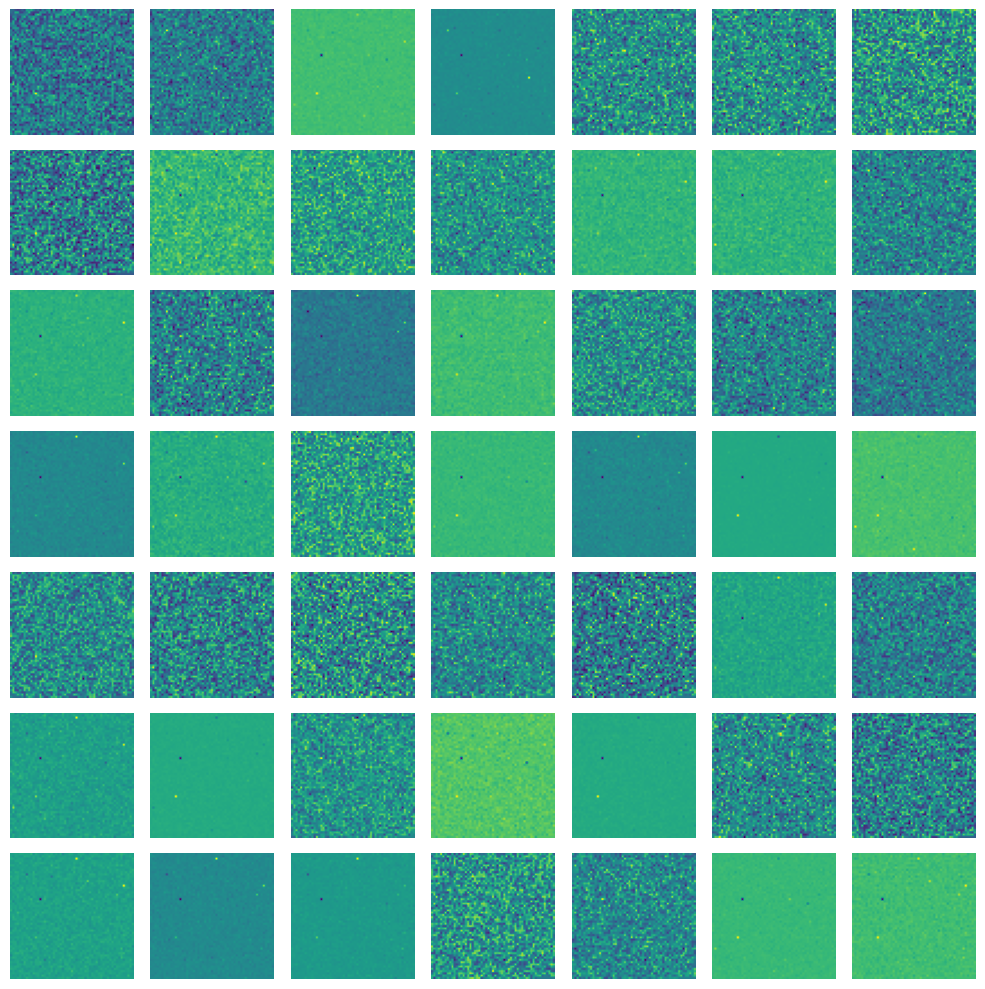

TrainingSAE(
  (activation_fn): ReLU()
  (hook_sae_input): HookPoint()
  (hook_sae_acts_pre): HookPoint()
  (hook_sae_acts_post): HookPoint()
  (hook_sae_output): HookPoint()
  (hook_sae_recons): HookPoint()
  (hook_sae_error): HookPoint()
)


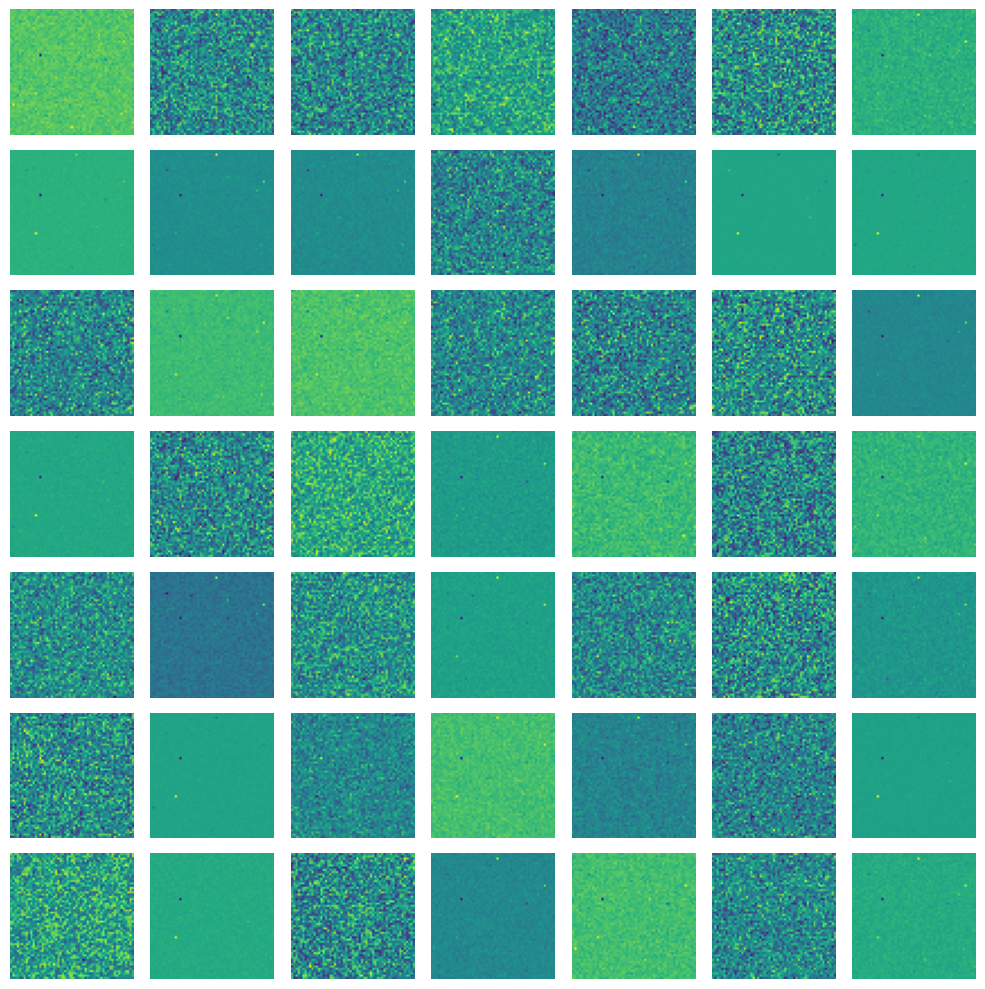

TrainingSAE(
  (activation_fn): ReLU()
  (hook_sae_input): HookPoint()
  (hook_sae_acts_pre): HookPoint()
  (hook_sae_acts_post): HookPoint()
  (hook_sae_output): HookPoint()
  (hook_sae_recons): HookPoint()
  (hook_sae_error): HookPoint()
)


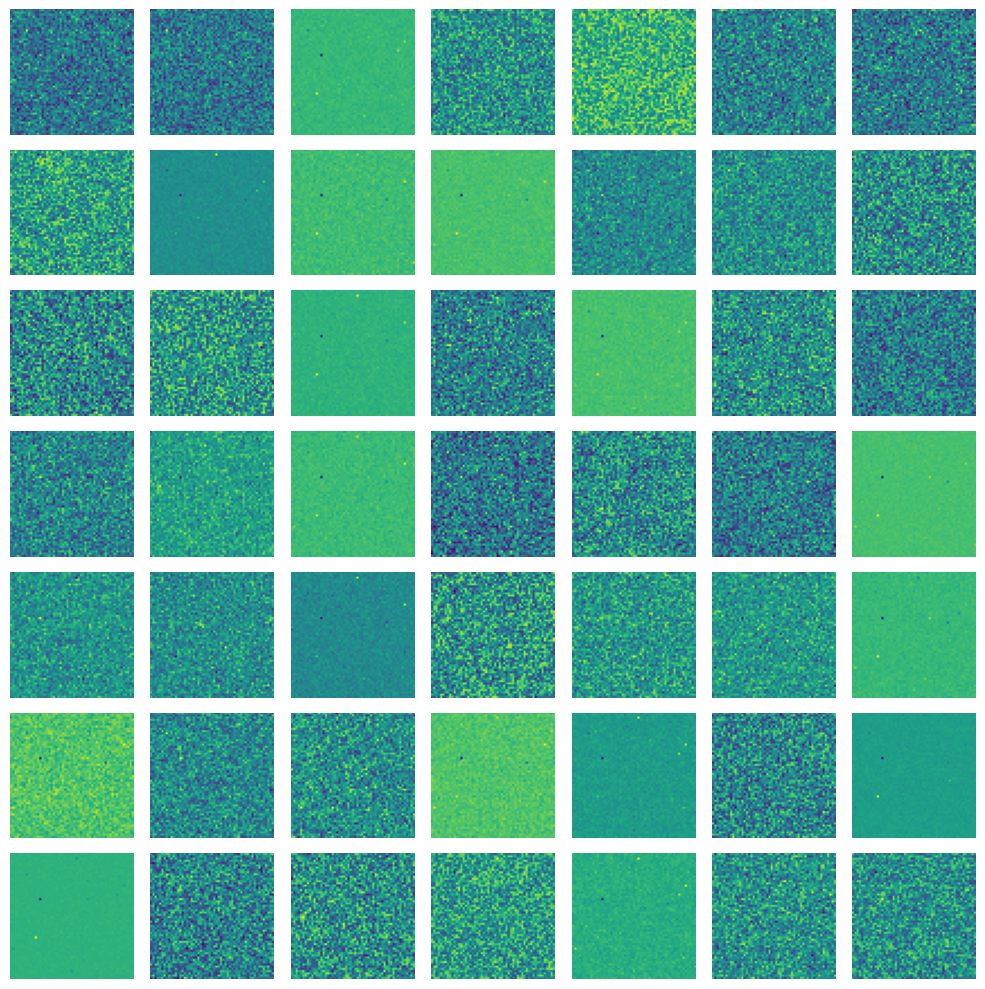

TrainingSAE(
  (activation_fn): ReLU()
  (hook_sae_input): HookPoint()
  (hook_sae_acts_pre): HookPoint()
  (hook_sae_acts_post): HookPoint()
  (hook_sae_output): HookPoint()
  (hook_sae_recons): HookPoint()
  (hook_sae_error): HookPoint()
)


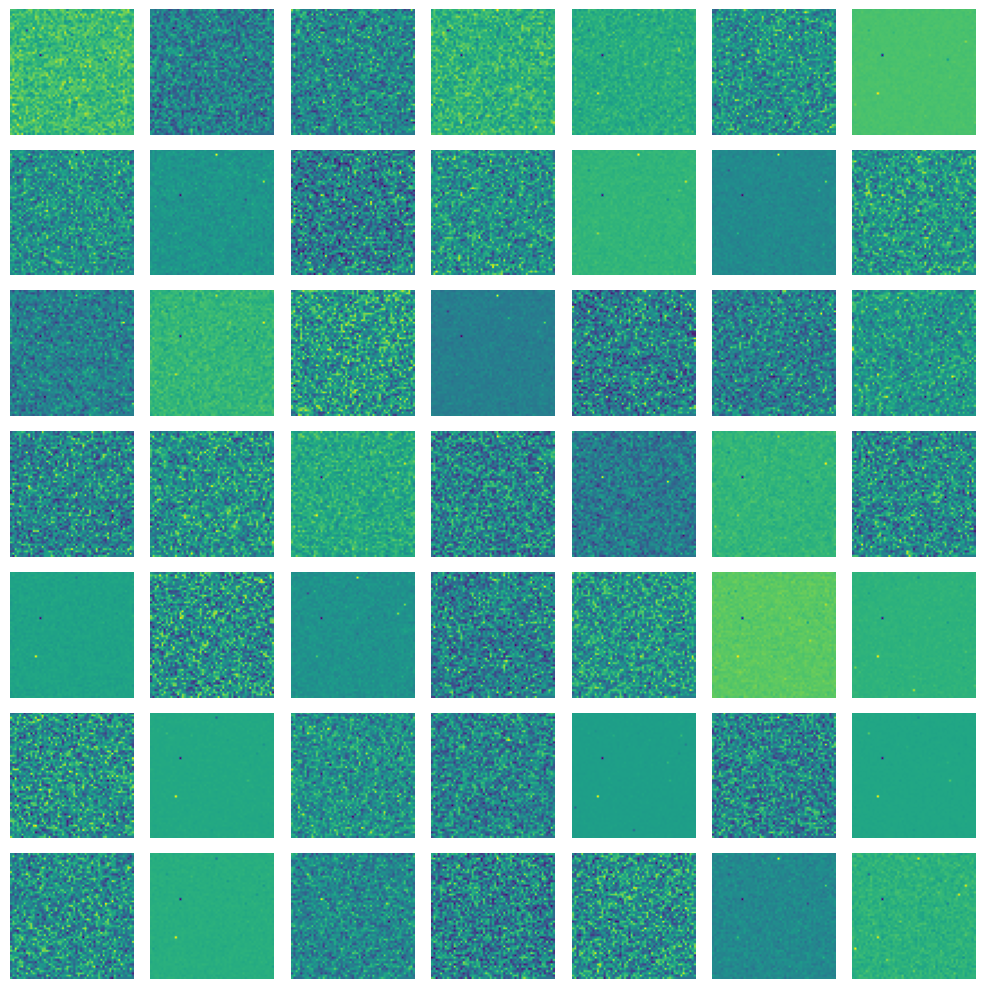

In [8]:
import matplotlib.pyplot as plt
import numpy as np
import random

def visualize_sae_features(sae, num_features=49, grid_size=(7, 7), random_selection=True):
    print(sae)
    # The decoder weights, which represent the learned features
    plt.figure(figsize=(10, 10))
    
    total_features = sae.W_dec.shape[0]
    if random_selection:
        feature_indices = random.sample(range(total_features), min(num_features, total_features))
    else:
        feature_indices = range(min(num_features, total_features))
    
    for i, idx in enumerate(feature_indices):
        plt.subplot(grid_size[0], grid_size[1], i+1)
        # Get the feature vector
        feature_vector = sae.W_dec[idx].detach().cpu().numpy()
        # Calculate dimensions for a rectangular shape
        feature_size = feature_vector.shape[0]
        width = int(np.sqrt(feature_size))
        height = feature_size // width
        if width * height != feature_size:
            height += 1
        # Reshape and pad if necessary
        feature_image = np.zeros((height * width,))
        feature_image[:feature_size] = feature_vector
        feature_image = feature_image.reshape(height, width)
        plt.imshow(feature_image)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Example usage:
visualize_sae_features(loaded_sae, num_features=49, grid_size=(7, 7), random_selection=True)
visualize_sae_features(loaded_sae_30, num_features=49, grid_size=(7, 7), random_selection=True)
visualize_sae_features(loaded_sae_exp, num_features=49, grid_size=(7, 7), random_selection=True)
visualize_sae_features(loaded_sae_exp4, num_features=49, grid_size=(7, 7), random_selection=True)

The output shows 9 heatmap-style images representing the first 9 feature vectors learned by the decoder of your sparse autoencoder (SAE). Here's how to interpret these images:

1. Each image represents a single feature vector from the decoder weights (W_dec).

2. Colors in the images represent the strength and direction of weights:
   - Brighter colors (yellow/light green) indicate larger positive weights.
   - Darker colors (dark blue/purple) indicate larger negative weights.
   - Mid-range colors (teal/green) represent weights close to zero.

3. Patterns in these images can reveal what kind of features the SAE has learned:
   - Uniform colors suggest the feature responds to overall intensity.
   - Localized bright or dark spots indicate the feature is sensitive to specific input positions.
   - Noisy patterns (like in the top-middle and top-right) might represent more complex or less interpretable features.

4. The bottom-right image appears mostly uniform, suggesting this feature might act more like a bias term.

5. Some images (e.g., bottom-left, bottom-middle) show a distinct bright spot, indicating these features are sensitive to specific localized patterns in the input.

6. The variation between images suggests the SAE has learned diverse features, which is generally desirable.

However, the relatively low contrast in most images and the presence of noise-like patterns might indicate that the features aren't as distinct or interpretable as they could be. This aligns with your earlier observation about low sparsity, as more sparse representations often lead to more interpretable features.

To improve feature interpretability and sparsity, you might consider:
1. Adjusting the SAE's hyperparameters (e.g., increasing sparsity penalties).
2. Using real data instead of random data for training, as you suggested.
3. Increasing the training duration or adjusting the learning rate.

Sparsity per feature for 30 SAE: 0:
Feature 0: 0.4910
Feature 1: 0.4800
Feature 2: 0.4900
Feature 3: 0.5150
Feature 4: 0.4720
Feature 5: 0.5050
Feature 6: 0.5030
Feature 7: 0.4740
Feature 8: 0.4960
Feature 9: 0.5250
Feature 10: 0.4890
Feature 11: 0.4670
Feature 12: 0.4960
Feature 13: 0.4860
Feature 14: 0.4990
Feature 15: 0.4920
Feature 16: 0.5200
Feature 17: 0.4870
Feature 18: 0.4780
Feature 19: 0.5060
Feature 20: 0.4780
Feature 21: 0.5120
Feature 22: 0.4620
Feature 23: 0.5090
Feature 24: 0.4820
Feature 25: 0.4860
Feature 26: 0.4730
Feature 27: 0.4800
Feature 28: 0.5090
Feature 29: 0.4790
Feature 30: 0.4960
Feature 31: 0.5070
Feature 32: 0.4810
Feature 33: 0.4800
Feature 34: 0.5070
Feature 35: 0.4840
Feature 36: 0.5090
Feature 37: 0.4840
Feature 38: 0.4840
Feature 39: 0.4750
Feature 40: 0.4760
Feature 41: 0.4740
Feature 42: 0.4970
Feature 43: 0.5080
Feature 44: 0.5080
Feature 45: 0.4690
Feature 46: 0.5050
Feature 47: 0.4920
Feature 48: 0.5010
Feature 49: 0.4930
Feature 50: 0.4850
Featu

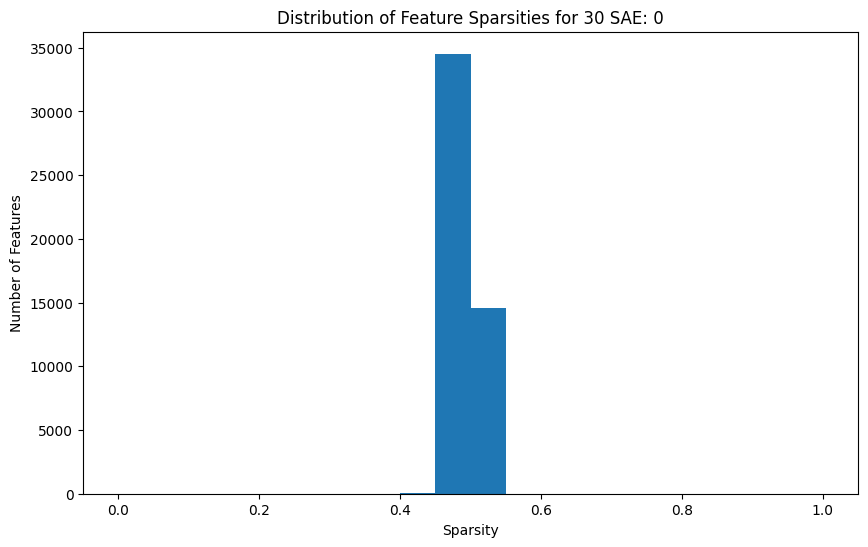

Sparsity per feature for 30 SAE: 30:
Feature 0: 0.4940
Feature 1: 0.4980
Feature 2: 0.5130
Feature 3: 0.4950
Feature 4: 0.5340
Feature 5: 0.4850
Feature 6: 0.5050
Feature 7: 0.5230
Feature 8: 0.4950
Feature 9: 0.5100
Feature 10: 0.4640
Feature 11: 0.4890
Feature 12: 0.5070
Feature 13: 0.4910
Feature 14: 0.4910
Feature 15: 0.4930
Feature 16: 0.4960
Feature 17: 0.5150
Feature 18: 0.5030
Feature 19: 0.5140
Feature 20: 0.4740
Feature 21: 0.5090
Feature 22: 0.5060
Feature 23: 0.4860
Feature 24: 0.5050
Feature 25: 0.5030
Feature 26: 0.5080
Feature 27: 0.4820
Feature 28: 0.4810
Feature 29: 0.4830
Feature 30: 0.5070
Feature 31: 0.4970
Feature 32: 0.5060
Feature 33: 0.4760
Feature 34: 0.5060
Feature 35: 0.5000
Feature 36: 0.4620
Feature 37: 0.5020
Feature 38: 0.5000
Feature 39: 0.4870
Feature 40: 0.5000
Feature 41: 0.4800
Feature 42: 0.4990
Feature 43: 0.5050
Feature 44: 0.5000
Feature 45: 0.4870
Feature 46: 0.4890
Feature 47: 0.5190
Feature 48: 0.5120
Feature 49: 0.5160
Feature 50: 0.5320
Feat

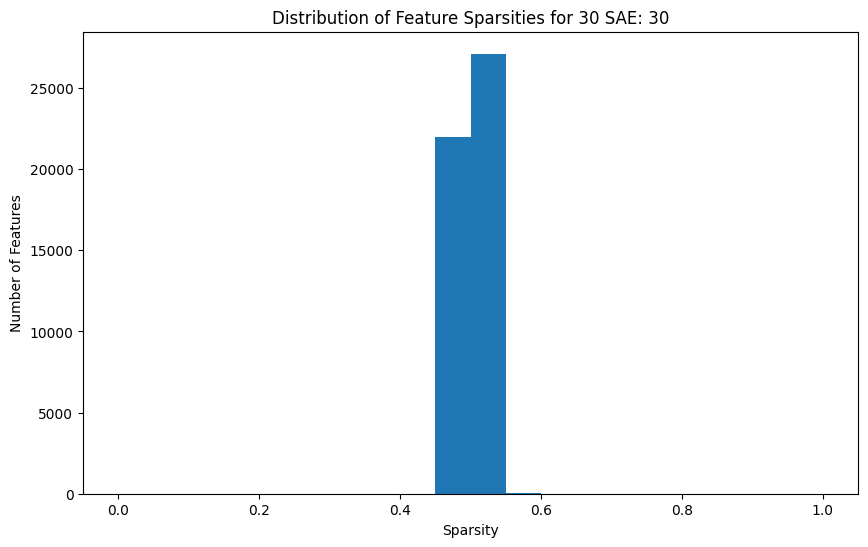

Sparsity per feature for 30 SAE: exp:
Feature 0: 0.5060
Feature 1: 0.5030
Feature 2: 0.4740
Feature 3: 0.4930
Feature 4: 0.5050
Feature 5: 0.4960
Feature 6: 0.5000
Feature 7: 0.5290
Feature 8: 0.4860
Feature 9: 0.5030
Feature 10: 0.5000
Feature 11: 0.4990
Feature 12: 0.5190
Feature 13: 0.4880
Feature 14: 0.5120
Feature 15: 0.5060
Feature 16: 0.4940
Feature 17: 0.4910
Feature 18: 0.4800
Feature 19: 0.4920
Feature 20: 0.4980
Feature 21: 0.5030
Feature 22: 0.5050
Feature 23: 0.5060
Feature 24: 0.5060
Feature 25: 0.4880
Feature 26: 0.5070
Feature 27: 0.5070
Feature 28: 0.5030
Feature 29: 0.4890
Feature 30: 0.5200
Feature 31: 0.5200
Feature 32: 0.4940
Feature 33: 0.4920
Feature 34: 0.5160
Feature 35: 0.5160
Feature 36: 0.5030
Feature 37: 0.5040
Feature 38: 0.4940
Feature 39: 0.4910
Feature 40: 0.4840
Feature 41: 0.5180
Feature 42: 0.5060
Feature 43: 0.4620
Feature 44: 0.5040
Feature 45: 0.4850
Feature 46: 0.4960
Feature 47: 0.5050
Feature 48: 0.4990
Feature 49: 0.5050
Feature 50: 0.5060
Fea

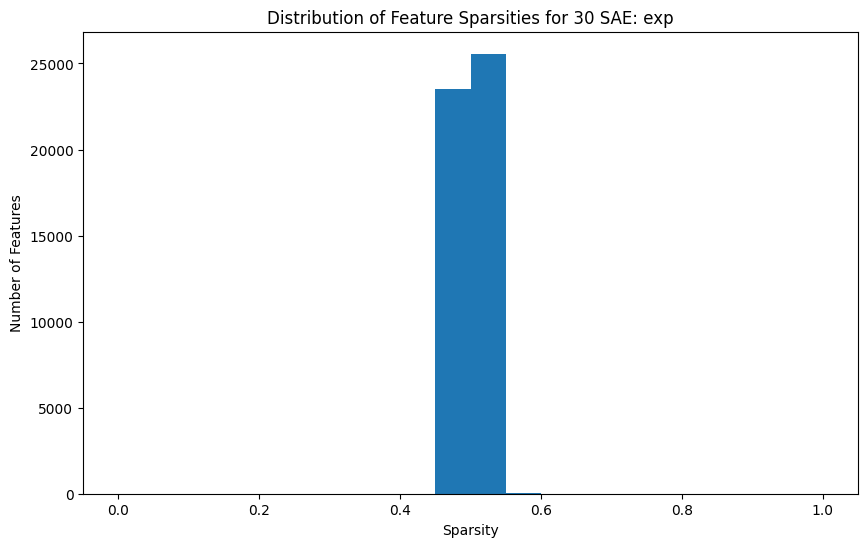

Sparsity per feature for 30 SAE: exp4:
Feature 0: 0.4950
Feature 1: 0.5270
Feature 2: 0.5210
Feature 3: 0.5330
Feature 4: 0.5200
Feature 5: 0.5040
Feature 6: 0.4600
Feature 7: 0.5080
Feature 8: 0.5180
Feature 9: 0.4860
Feature 10: 0.5100
Feature 11: 0.5180
Feature 12: 0.5170
Feature 13: 0.5160
Feature 14: 0.5010
Feature 15: 0.5100
Feature 16: 0.5050
Feature 17: 0.5100
Feature 18: 0.5190
Feature 19: 0.5440
Feature 20: 0.5280
Feature 21: 0.5110
Feature 22: 0.4790
Feature 23: 0.5080
Feature 24: 0.4990
Feature 25: 0.4930
Feature 26: 0.5200
Feature 27: 0.5160
Feature 28: 0.5160
Feature 29: 0.5330
Feature 30: 0.5330
Feature 31: 0.5000
Feature 32: 0.5030
Feature 33: 0.4790
Feature 34: 0.5010
Feature 35: 0.4950
Feature 36: 0.5110
Feature 37: 0.5030
Feature 38: 0.5140
Feature 39: 0.5110
Feature 40: 0.5020
Feature 41: 0.4900
Feature 42: 0.4760
Feature 43: 0.5020
Feature 44: 0.5210
Feature 45: 0.5070
Feature 46: 0.5180
Feature 47: 0.5140
Feature 48: 0.5110
Feature 49: 0.5170
Feature 50: 0.4790
Fe

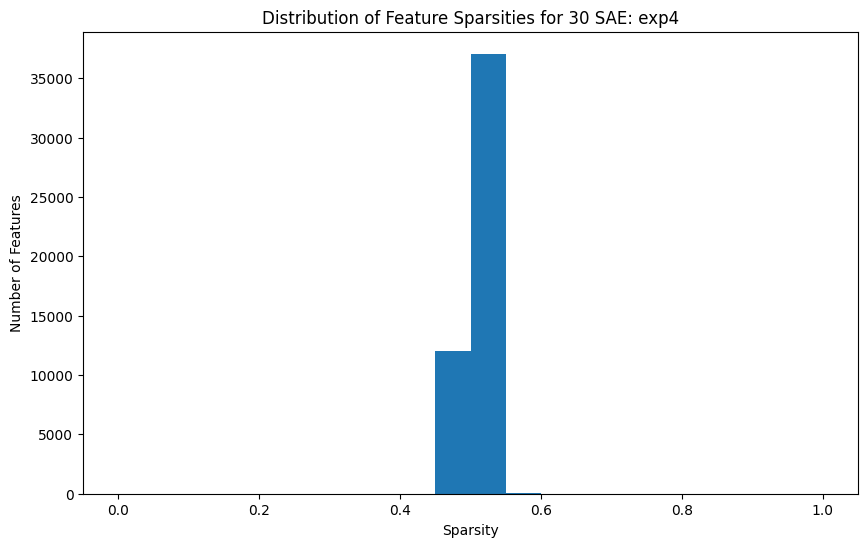

In [9]:
def analyze_feature_sparsity(sae, name):
    # Encode some input data
    input_data = torch.randn(1000, sae.cfg.d_in, device="cuda:0")  # Increased to 1000 samples for better statistics
    feature_acts = sae.encode_standard(input_data)

    # Calculate sparsity for each feature
    feature_sparsity = (feature_acts == 0).float().mean(dim=0)
    
    print(f"Sparsity per feature for {sae.cfg.hook_layer} SAE: {name}:")
    for i, sparsity in enumerate(feature_sparsity):
        print(f"Feature {i}: {sparsity.item():.4f}")
    
    # Calculate overall sparsity
    overall_sparsity = feature_sparsity.mean()
    print(f"\nOverall sparsity: {overall_sparsity.item():.4f} SAE: {name}")

    # Plot histogram of feature sparsities
    plt.figure(figsize=(10, 6))
    plt.hist(feature_sparsity.cpu().numpy(), bins=20, range=(0, 1))
    plt.title(f"Distribution of Feature Sparsities for {sae.cfg.hook_layer} SAE: {name}")
    plt.xlabel("Sparsity")
    plt.ylabel("Number of Features")
    plt.show()

# Analyze feature sparsity for both SAEs
analyze_feature_sparsity(loaded_sae, "0")
analyze_feature_sparsity(loaded_sae_30, "30")
analyze_feature_sparsity(loaded_sae_exp, "exp")
analyze_feature_sparsity(loaded_sae_exp4, "exp4")

In [10]:
## To compare I load a gemmini SAE to understand its Sparsity and distribution
from sae_lens import SAE

sae, cfg_dict, sparsity = SAE.from_pretrained(
    release = "gpt2-small-res-jb", # <- Release name 
    sae_id = "blocks.7.hook_resid_pre", # <- SAE id (not always a hook point!)
    device = "cuda:0"
)

Sparsity per feature for 7 SAE: 0:
Feature 0: 1.0000
Feature 1: 0.7730
Feature 2: 1.0000
Feature 3: 0.0710
Feature 4: 0.2710
Feature 5: 0.3610
Feature 6: 0.1250
Feature 7: 1.0000
Feature 8: 0.9990
Feature 9: 0.9870
Feature 10: 0.8340
Feature 11: 0.9980
Feature 12: 0.9400
Feature 13: 0.9350
Feature 14: 0.9970
Feature 15: 0.9460
Feature 16: 0.9990
Feature 17: 0.0940
Feature 18: 0.9910
Feature 19: 0.9810
Feature 20: 0.9710
Feature 21: 0.7990
Feature 22: 1.0000
Feature 23: 0.1020
Feature 24: 0.9930
Feature 25: 1.0000
Feature 26: 0.9790
Feature 27: 1.0000
Feature 28: 0.9850
Feature 29: 0.9890
Feature 30: 0.4070
Feature 31: 0.9990
Feature 32: 0.9950
Feature 33: 0.6470
Feature 34: 1.0000
Feature 35: 0.9970
Feature 36: 0.9360
Feature 37: 0.9930
Feature 38: 0.2810
Feature 39: 0.9780
Feature 40: 0.7370
Feature 41: 0.9930
Feature 42: 0.9960
Feature 43: 0.7640
Feature 44: 0.9400
Feature 45: 1.0000
Feature 46: 0.9790
Feature 47: 0.9900
Feature 48: 0.8780
Feature 49: 0.7470
Feature 50: 0.7920
Featur

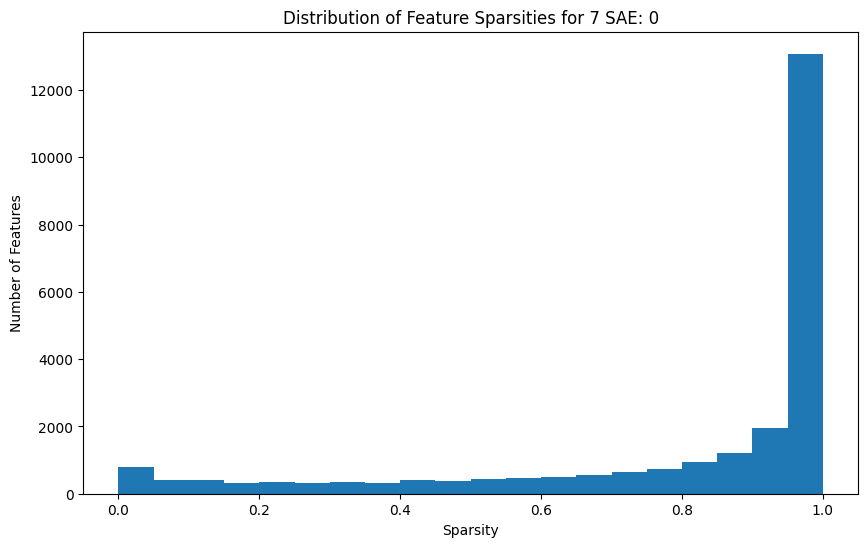

In [11]:
analyze_feature_sparsity(sae, "0")

SAE(
  (activation_fn): ReLU()
  (hook_sae_input): HookPoint()
  (hook_sae_acts_pre): HookPoint()
  (hook_sae_acts_post): HookPoint()
  (hook_sae_output): HookPoint()
  (hook_sae_recons): HookPoint()
  (hook_sae_error): HookPoint()
)


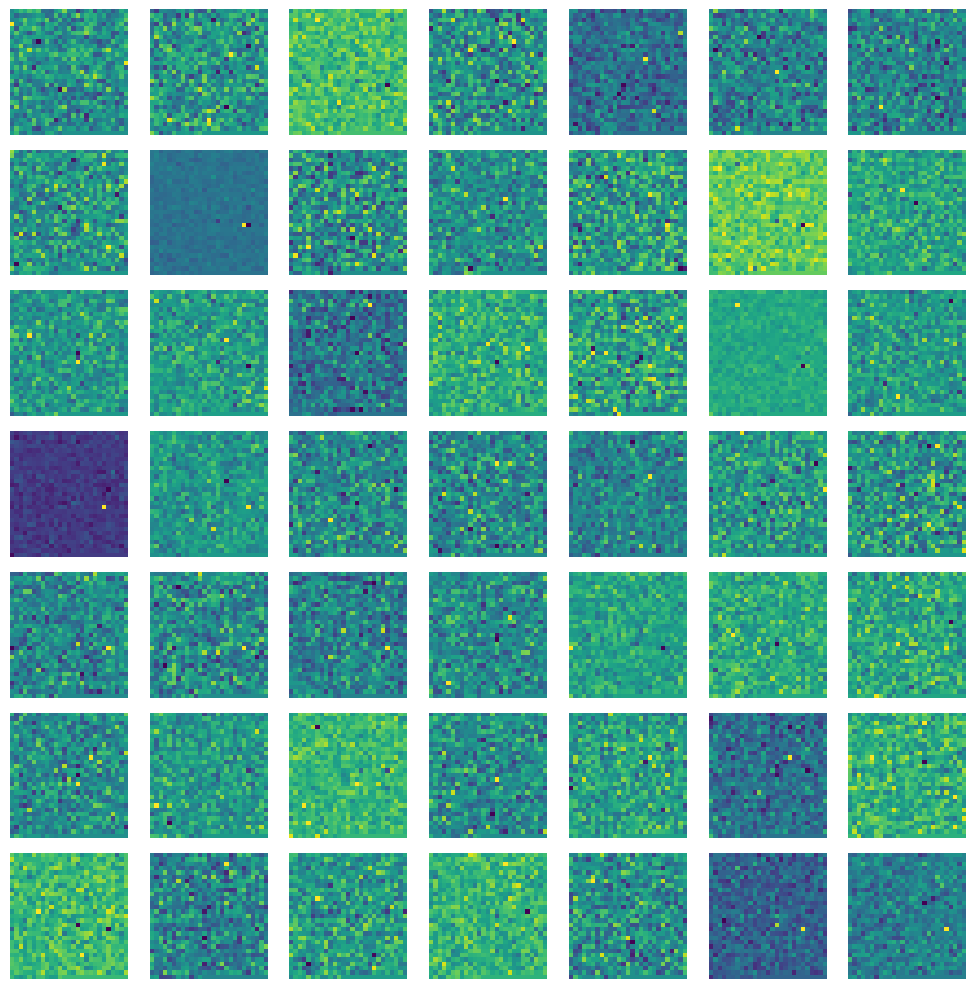

In [13]:
visualize_sae_features(sae=sae, num_features=49, grid_size=(7,7), random_selection=True)

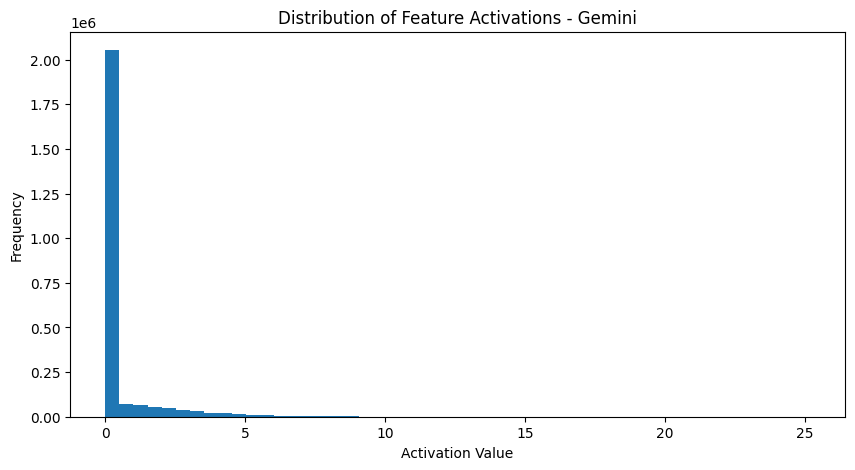

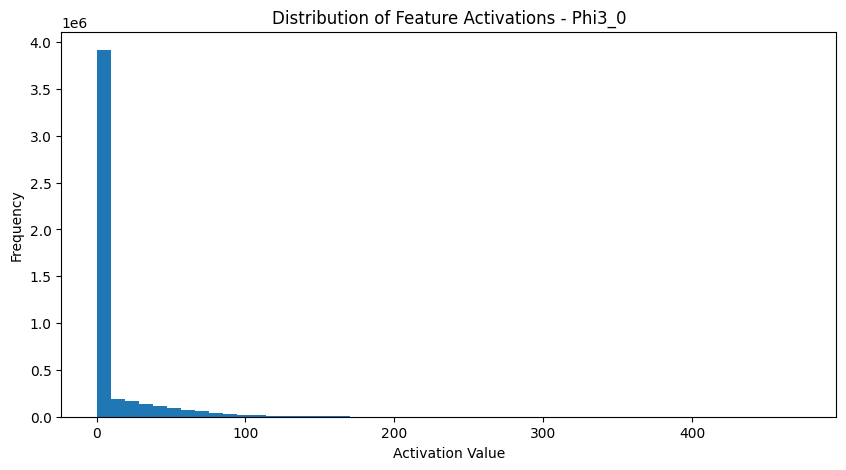

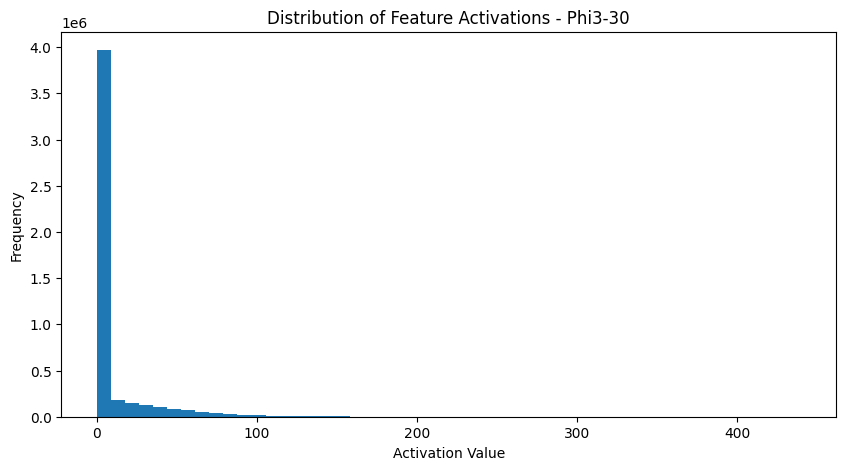

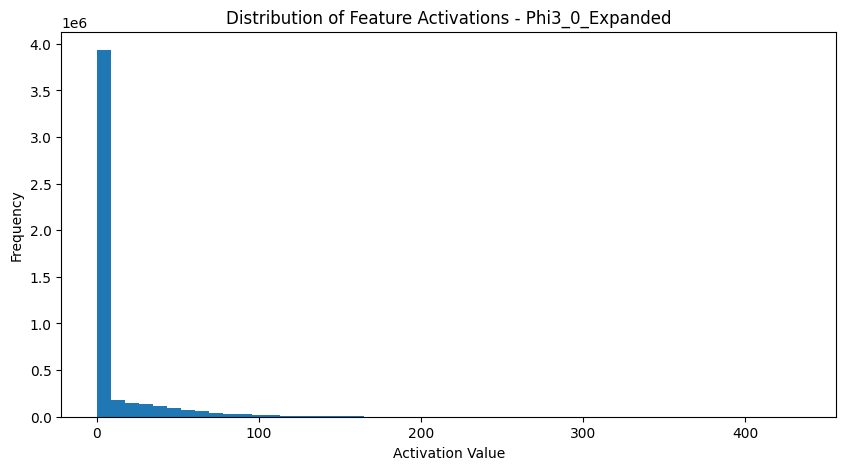

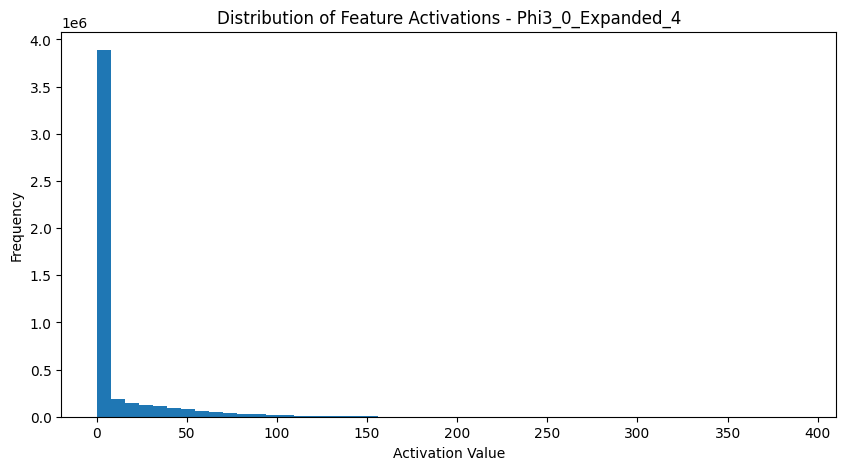

In [12]:
def plot_feature_activation_distribution(sae, name):
    # Encode some input data
    input_data = torch.randn(100, sae.cfg.d_in, device="cuda:0")  # 100 random samples
    feature_acts = sae.encode_standard(input_data)
    
    ## Distribution of Feature Activation
    plt.figure(figsize=(10, 5))
    plt.hist(feature_acts.flatten().detach().cpu().numpy(), bins=50)
    plt.title(f"Distribution of Feature Activations - {name}")
    plt.xlabel("Activation Value")
    plt.ylabel("Frequency")
    plt.show()

# Call the function for all three SAEs
plot_feature_activation_distribution(sae=sae, name="Gemini")
plot_feature_activation_distribution(sae=loaded_sae, name="Phi3_0")
plot_feature_activation_distribution(sae=loaded_sae_30, name="Phi3-30")
plot_feature_activation_distribution(sae=loaded_sae_exp, name="Phi3_0_Expanded")
plot_feature_activation_distribution(sae=loaded_sae_exp4, name="Phi3_0_Expanded_4")


Idea? This Plot does not help to understand if the SAE was trained good. Perhaps the training must be longer to get better results. The L1 Error must be going down ?

And perhaps the Dimensionality must be bigger. 

gpt2-small - blocks.7.hook_resid_pre


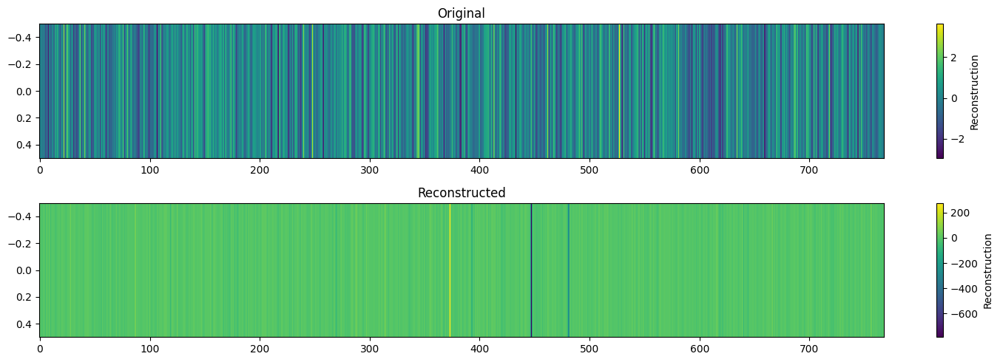

microsoft/Phi-3-mini-4k-instruct - blocks.0.hook_mlp_out


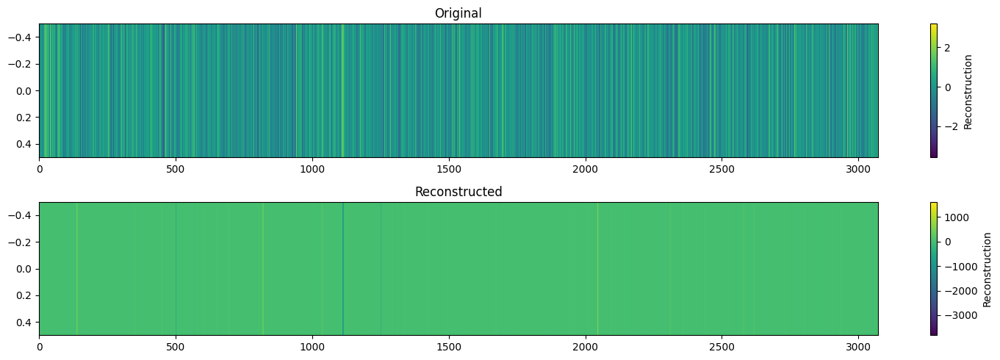

microsoft/Phi-3-mini-4k-instruct - blocks.0.hook_mlp_out


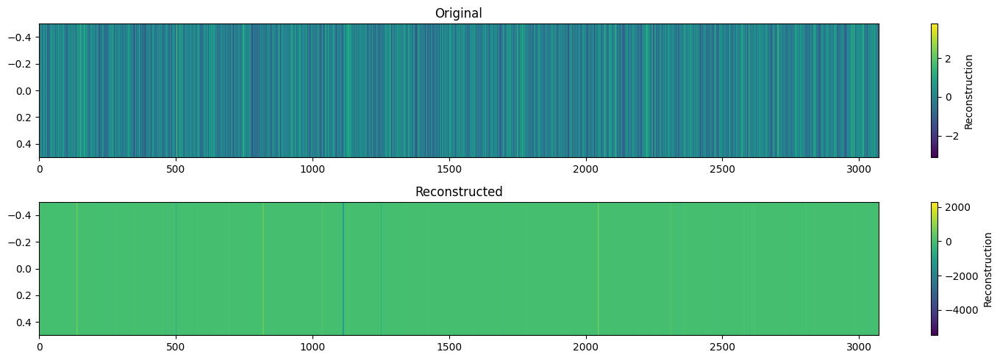

microsoft/Phi-3-mini-4k-instruct - blocks.0.hook_mlp_out


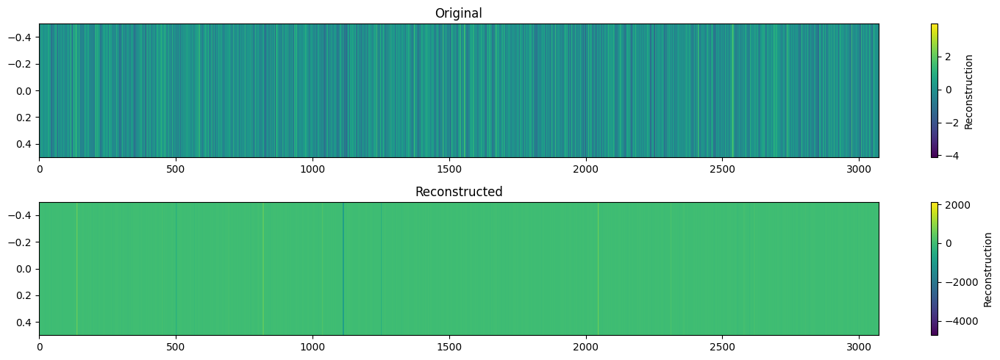

microsoft/Phi-3-mini-4k-instruct - blocks.0.hook_mlp_out


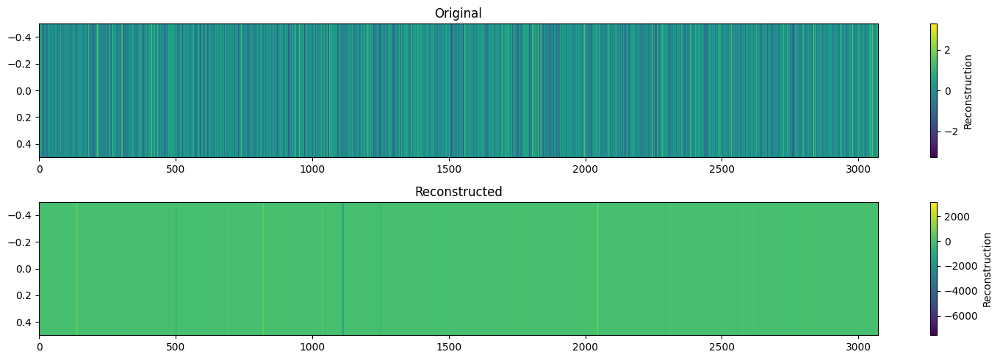

In [13]:
def visualize_sae_reconstruction(sae):
    print(sae.cfg.model_name + " - " +  sae.cfg.hook_name)
    input_data = torch.randn(1, sae.cfg.d_in, device="cuda:0")
    reconstructed = sae(input_data)

    # Reshape the data to 1D
    input_reshaped = input_data.view(-1).detach().cpu().numpy()
    reconstructed_reshaped = reconstructed.view(-1).detach().cpu().numpy()

    plt.figure(figsize=(15, 5))
    
    # Plot original data
    plt.subplot(2, 1, 1)
    im1 = plt.imshow(input_reshaped.reshape(1, -1), aspect='auto', cmap='viridis')
    plt.title("Original")
    plt.colorbar(im1, label='Reconstruction')
    
    # Plot reconstructed data
    plt.subplot(2, 1, 2)
    im2 = plt.imshow(reconstructed_reshaped.reshape(1, -1), aspect='auto', cmap='viridis')
    plt.title("Reconstructed")
    plt.colorbar(im2, label='Reconstruction')
    
    plt.tight_layout()
    plt.show()



# Example usage:
visualize_sae_reconstruction(sae)
visualize_sae_reconstruction(loaded_sae)
visualize_sae_reconstruction(loaded_sae_30)
visualize_sae_reconstruction(loaded_sae_exp)
visualize_sae_reconstruction(loaded_sae_exp4)

Interesting is the differences in ractivation. Shouldn't it be identical to the original one? But It seems that the gemini pretrained onw works much better because there are more  ? 

### Interpreting Features ?

In [16]:
## Load Model:
# from transformer_lens import HookedTransformer
from sae_lens import SAE, HookedSAETransformer

model = HookedSAETransformer.from_pretrained("microsoft/Phi-3-mini-4k-instruct", device = "cuda:0")

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Loaded pretrained model microsoft/Phi-3-mini-4k-instruct into HookedTransformer


In [17]:
import pandas as pd

# Let's start by getting the top 10 logits for each feature
projection_onto_unembed = loaded_sae_exp.W_dec @ model.W_U

# get the top 10 logits.
vals, inds = torch.topk(projection_onto_unembed, 10, dim=1)

# get 10 random features
random_indices = torch.randint(0, projection_onto_unembed.shape[0], (10,))

# Show the top 10 logits promoted by those features
top_10_logits_df = pd.DataFrame(
    [model.to_str_tokens(i) for i in inds[random_indices]],
    index=random_indices.tolist(),
).T
top_10_logits_df

,17522,42908,30259,15891,30127,31220,5183,25754,40134,19035
0,leased,explo,län,,bject,ome,Desp,atre,irs,ideo
1,onn,Torre,ɨ,Dest,kbd,wind,enough,desen,kord,word
2,yed,es,feu,dest,uru,ched,established,}|,leb,mans
3,bag,ë,zeuge,ltre,baar,shed,burn,oun,ía,feed
4,views,andra,defense,Petersburg,zm,",]",come,)|,ixa,ament
5,anni,HashMap,département,－,omb,Marsh,Seite,ouch,ies,ashi
6,fig,◄,ą,Sé,orr,further,ington,hidden,roll,miss
7,Views,occ,校,<0xD7>,dienst,ing,comes,rin,ordering,fix
8,nim,gable,Christ,Mey,oru,Reserve,bü,touched,hand,Net
9,../,Classification,Click,Martí,change,Í,uve,flows,lit,ide
